## Import

In [ ]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [ ]:
import os,sys, kimimaro
import numpy as np
from skimage.morphology import disk, ball, square
import scipy.ndimage as nd
import scipy.signal as sig
import matplotlib.pyplot as plt
import matplotlib.animation as anim
import cloudvolume as cv
from IPython.display import HTML
from matplotlib.collections import LineCollection

sys.path.append("/home/ehefti/Github/axon_tracking/")
import axon_tracking.skeletonization as skel
import axon_tracking.template_extraction as te
import axon_tracking.visualization as vis
import axon_tracking.utils as ut

## Templates Overview

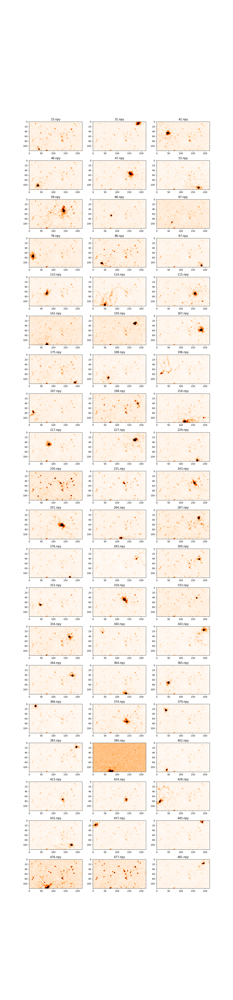

In [3]:
root_path = '/net/bs-filesvr02/export/group/hierlemann/intermediate_data/Maxtwo/phornauer/Torsten_2/241021/T002523/AxonTracking'
stream_id = 'well003'
suffix = "sorter_output" 
overview_path = os.path.join(root_path, stream_id, suffix) 
vis.plot_template_overview(overview_path, n_cols = 3, vmin=-10, vmax=0, filename='overview', unit_ids= None, overwrite=False)

## Remove neurons that appear on many templates

In [4]:
from skimage.feature import peak_local_max
from scipy.ndimage import binary_dilation, generate_binary_structure


def identify_ubiquitous_peaks(templates, min_distance=5, threshold_abs=None, threshold_rel=0.1):
    """
    Calculates the median and finds peaks using skimage.feature.peak_local_max.

    Args:
        templates: List of 3D numpy arrays.
        min_distance: Minimum distance between peaks (in voxels).
        threshold_abs: Absolute intensity threshold.
        threshold_rel: Relative intensity threshold (fraction of max value).

    Returns:
        median_template, peak_coordinates (as a NumPy array)
    """
    stacked_templates = np.stack(templates, axis=0)
    median_template = np.median(stacked_templates, axis=0)

    peak_coordinates = peak_local_max(
        median_template,
        min_distance=min_distance,
        threshold_abs=threshold_abs,
        threshold_rel=threshold_rel,
    )
    print(peak_coordinates)

    return median_template, peak_coordinates



def process_templates(sorter_path, input_folder, output_folder, min_distance=5, threshold_abs=None, threshold_rel=0.1, dilation_iterations=3):
    """
    This function creates a median template, detects peaks, removes these peaks from each template, and saves them to a new folder.

    Args:
        input_folder: Path to the original templates (.npy files).
        output_folder: Path for the processed templates.
        min_distance: Minimum distance between peaks.
        threshold_abs: Absolute intensity threshold for peak detection.
        threshold_rel: Relative intensity threshold for peak detection (fraction of max).
        dilation_iterations: Number of iterations for dilating the peak mask.
    """

    # Create paths
    input_path = os.path.join(sorter_path, input_folder)
    output_path = os.path.join(sorter_path, output_folder)

    if not os.path.exists(output_path):
        os.makedirs(output_path)
    
    # Load Templates
    template_files = [f for f in os.listdir(input_path) if f.endswith('.npy')]
    templates = []
    for file in template_files:
        filepath = os.path.join(input_path, file)
        template = np.load(filepath)  # Load using np.load for .npy files
        templates.append(template)

    # Average and Find Peaks (using the skimage function)
    median_template, peak_coordinates = identify_ubiquitous_peaks(templates, 
                                                                  min_distance = min_distance, 
                                                                  threshold_abs = threshold_abs, 
                                                                  threshold_rel = threshold_rel)

    # Create a Mask for Peak Removal
    peak_mask = np.zeros(median_template.shape, dtype=bool)
    for z, y, x in peak_coordinates:
        peak_mask[z, y, x] = True

    # Dilate the mask, so we also remove the region around the peak, not only the peak itself
    struct = generate_binary_structure(3, 1)
    dilated_peak_mask = binary_dilation(peak_mask, structure=struct, iterations=dilation_iterations)

    # Process Each Template and Save
    for i, template in enumerate(templates):
        # Remove peaks
        processed_template = template.copy()
        processed_template[dilated_peak_mask] = 0

        # Save the processed template
        output_filename = os.path.join(output_path, template_files[i])
        np.save(output_filename, processed_template)  # Save using np.save for .npy files
    print(f"Processed templates saved to: {output_folder}")

In [5]:
input_folder = "templates"
output_folder = "templates_processed"

process_templates(overview_path, input_folder, output_folder, min_distance=5, threshold_rel=0.2, dilation_iterations=2)

[[174  31  29]
 [156  40  16]
 [174  31  64]
 [175  31  36]
 [156  40  26]
 [179  43  40]
 [137  79  16]
 [185  58  40]
 [ 13  82  49]
 [135  77  62]
 [135  77  22]
 [156  40  64]
 [107  29  25]
 [136  77   7]
 [173  32  13]
 [ 36 103  35]
 [ 15  74  15]
 [ 48  47  22]
 [156  40  43]
 [ 15  75  67]
 [106  29  17]
 [179  43   6]
 [ 38  26   8]
 [134  61  54]
 [175  32   5]
 [ 16  75  27]
 [ 38  26  36]
 [ 15  76  48]
 [136  79  55]
 [133  61  30]
 [184  57  51]
 [ 38  26  74]
 [ 38  26  55]
 [ 37 103  25]
 [187   9   6]
 [ 13  82  18]
 [133  62  44]
 [ 47  72   8]
 [175 100  56]
 [184  59  30]
 [134  62   8]
 [ 31  66  69]
 [174 101  36]
 [ 38  26  62]
 [ 37 103   7]
 [187   9  38]
 [ 15  74  59]
 [107  28  51]
 [133  60  67]
 [ 46  71  23]
 [136  79  39]
 [194  17  39]
 [184  59  17]
 [173  32  52]
 [194  17  53]
 [ 49 114  25]
 [156  40  54]
 [ 82  50  12]
 [106  29  44]
 [187   9  70]
 [143  48  73]
 [105  29  72]
 [ 48  73  41]
 [ 88  54  67]
 [107  29  60]
 [179  43  55]
 [ 36 102 

In [7]:
vis.plot_template_overview2(overview_path, n_cols = 3, vmin=-10, vmax=0, foldername='templates_processed', filename='overview_processed', unit_ids= None, overwrite=True)

## Choose and Preprocessing Template

In [9]:
params = dict()
params['noise_threshold'] = -0.5 # Noise threshold as factor of the noise level (None to skip)
params['abs_threshold'] = -0.15 # Absolut threshold in [uV]/sample
params['upsample'] = [0.5,0.5,0.25] # Spacing for interpolation in [x,y,z] direction
params['sampling_rate'] = 10000/params['upsample'][2] # [Hz]
params['ms_cutout'] = [3.0, 5.0] # Cutout in ms before and after the spike
#params['filter_footprint'] = ball(1)
params['max_velocity'] = 0.8 # [m/s]
params['max_noise_level'] = 0.25 # Mean of the noise level/matrix
params['el_spacing'] = 17.5 * params['upsample'][0] # Electrode spacing in um
params['ais_detection'] = "dev" # "time" or "dev" or "amp" or None
params['buffer_frames'] = 10 # Buffer frames for the ais cutout - time before the highest peak (otherwise we have a huge gap)

In [36]:
root_path = '/net/bs-filesvr02/export/group/hierlemann/intermediate_data/Maxtwo/phornauer/EI_iNeurons/241218/T002523/AxonTracking'
stream_id = 'well023'
suffix = "sorter_output" # Typically the sorter_output folder
template_folder = "templates" # Subfolder containing the templates
template_id = 86
full_path = os.path.join(root_path, stream_id, suffix, template_folder) 
template, template_save_file = skel.load_template_file(full_path, template_id)

### Volume Filter

In [40]:
def volume_filter(template, min_volume, max_volume):
    volume = np.sum(np.abs(template))
    print(volume)
    return min_volume <= volume <= max_volume

if not volume_filter(template, min_volume=1000, max_volume=1000000):
    print("Template rejected: volume out of range")

835558.2203201987


In [38]:
max = np.max(template)
print(max)

10.180864334106445


### Solidity Filter

In [39]:
from scipy.spatial import ConvexHull
from skimage.morphology import convex_hull_image

def solidity_filter(template, min_solidity):
    # Use skimage's convex_hull_image for binary data
    convex_hull = convex_hull_image(template)
    template_volume = np.sum(template)
    convex_hull_volume = np.sum(convex_hull)
    print(template_volume, convex_hull_volume)

    # Avoid division by zero
    if convex_hull_volume == 0:
        return False

    solidity = template_volume / convex_hull_volume
    print(solidity)
    return solidity >= min_solidity

# Example usage:
if not solidity_filter(template, min_solidity=0.1): # Adjust min_solidity
    print("Template rejected: low solidity")



# We would have to do that locally around the local maxima<

1021.9701802842319 2111998
0.0004838878541950475
Template rejected: low solidity


In [10]:
interp_temp, interp_noise, ais = skel.preprocess_template(template, params)

## Template Visualisation

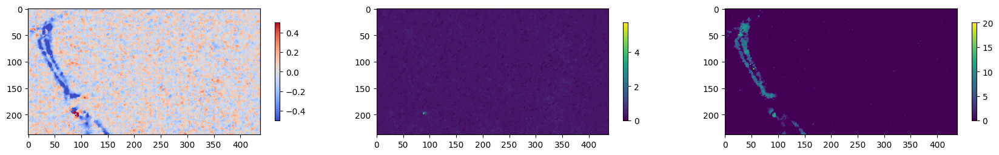

In [11]:
params['max_velocity'] = 0.8 # [m/s]
params['abs_threshold'] = -0.1
params['noise_threshold'] = -0.75
th_template = skel.threshold_template(interp_temp, interp_noise, ais, params) #boolean matrix
vis.plot_template_and_noise(interp_temp, interp_noise, th_template, vrange=[-0.5, 0.5])

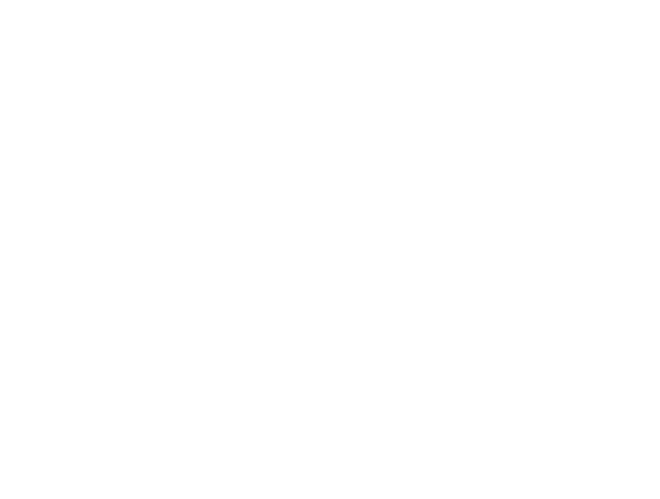

In [12]:
ani = vis.generate_propagation_gif(interp_temp, params = params, cumulative=False, downsample=4, clim=[-1,-0.01], cmap="Greys", marker_size=0.1,spacing=1)
HTML(ani.to_jshtml())

## Skeletonization

In [ ]:
skel_params = dict()
skel_params['scale'] = 2                       #1
skel_params['const'] = 10                      #3
skel_params['dust_threshold'] = 10
skel_params['anisotropy'] = (10,10,10)
skel_params['tick_threshold'] = 10
skel_params['n_jobs'] = 16

In [ ]:
t_cap = [0, th_template.shape[2]] #in samples
skels = skel.skeletonize(th_template[:,:,t_cap[0]:t_cap[1]].astype('bool'), **skel_params)

skeleton = kimimaro.join_close_components(skels[1], radius=50)
skeleton = kimimaro.postprocess(skeleton, tick_threshold=5, dust_threshold=10)
skeleton = skeleton.consolidate()

Skeletonizing Labels:  59%|█████▉    | 16/27 [00:00<00:00, 63.89it/s]


In [21]:
skeleton = skeleton.average_smoothing(n=4,check_boundary=False) #Interferes with scaling
skel_paths = cv.Skeleton.paths(skeleton)
skel_paths_scaled = ut.convert_coor_scale(skel_paths, params)

(<Figure size 640x480 with 2 Axes>, <Axes: >)

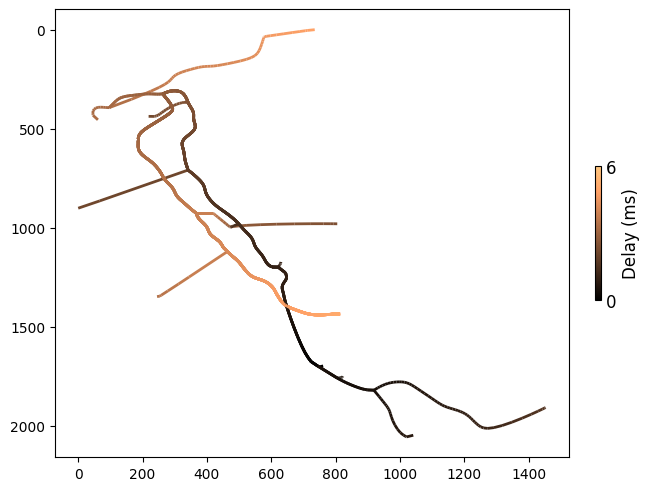

In [26]:
vis.plot_delay_skeleton(skel_paths_scaled, params, skel_params, figsize=0.5, ais=None, plot_ais_connection=False)

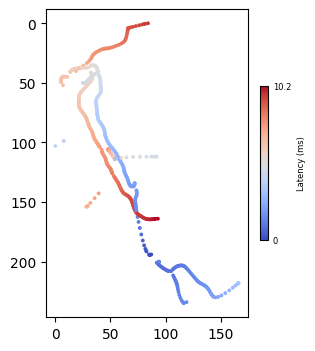

In [23]:
x,y,z = vis.plot_skeleton(skeleton, marker_size=3,fig_size=4,ais=[])

## Quality Control

In [27]:
qc_params = dict()
qc_params['window_size'] = 5
qc_params['max_duplicate_ratio'] = 0.3
qc_params['min_r2'] = 0.9
qc_params['vel_range'] = [0.3, 0.8]
qc_params['min_length'] = 1

In [28]:
all_branches = skel.branches_from_paths(skeleton)
scaled_qc_list, r2s, vels, lengths = skel.perform_path_qc(all_branches, params,**qc_params)

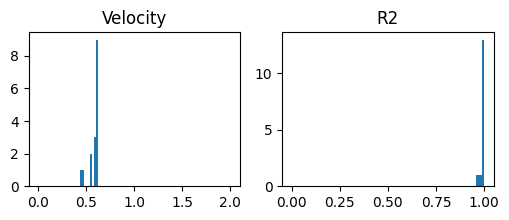

In [29]:
vis.plot_velocity_qc(vels,r2s,fig_size=(6,2))

(<Figure size 640x480 with 2 Axes>, <Axes: >)

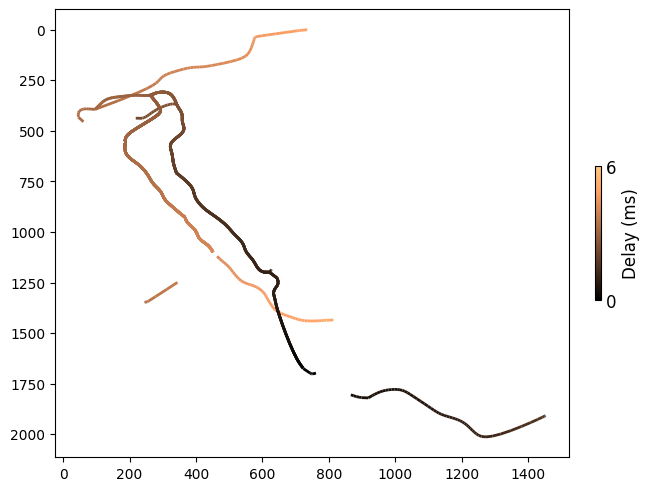

In [30]:
vis.plot_delay_skeleton(scaled_qc_list, params, skel_params, figsize=0.5, ais=None, plot_ais_connection=False)

## Fixing Skeleton

In [32]:
qc_skel = [skeleton.from_path(x) for x in scaled_qc_list]

In [45]:
qc_skeleton = skeleton.simple_merge(qc_skel)
qc_skeleton = kimimaro.join_close_components(qc_skeleton,radius=100)
qc_skeleton = kimimaro.postprocess(qc_skeleton, dust_threshold=500, tick_threshold=10)
qc_skeleton = qc_skeleton.consolidate()

761.25


(<Figure size 640x480 with 2 Axes>, <Axes: >)

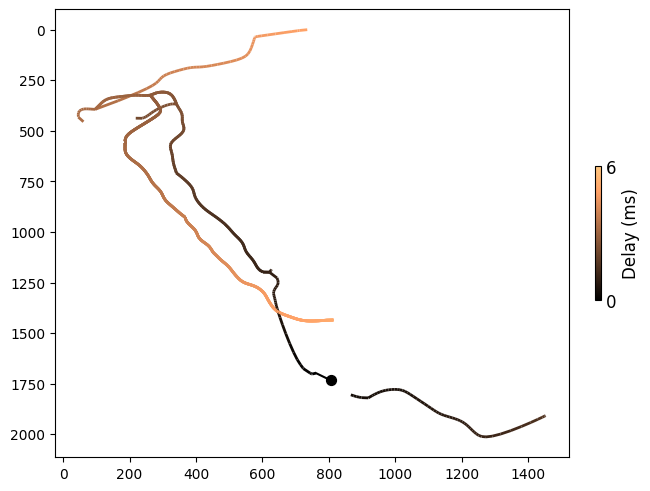

In [54]:
ais_um = np.array(ais) * (params["el_spacing"],params["el_spacing"],1)
vis.plot_delay_skeleton(qc_skeleton.paths(), params, skel_params,figsize=0.5, ais=ais_um, plot_ais_connection=True)

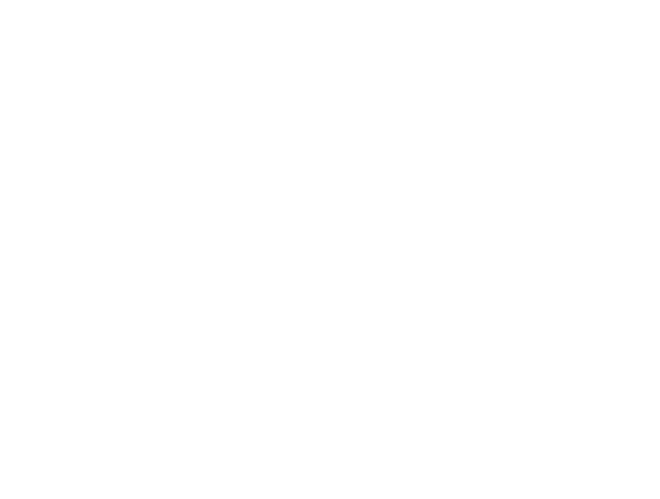

In [ ]:
plot_vertices = qc_skeleton.vertices / (params["el_spacing"],params["el_spacing"],1) # convert x and y to um, keep z in samples
ani = vis.generate_propagation_gif(interp_temp, params = params, cumulative=False, vertices=plot_vertices, downsample=4, clim=[-2, -0.1], cmap="Greys", marker_size=0.1)
HTML(ani.to_jshtml())

In [76]:
np.min(interp_temp)

-2.816161632537842

## Save Images

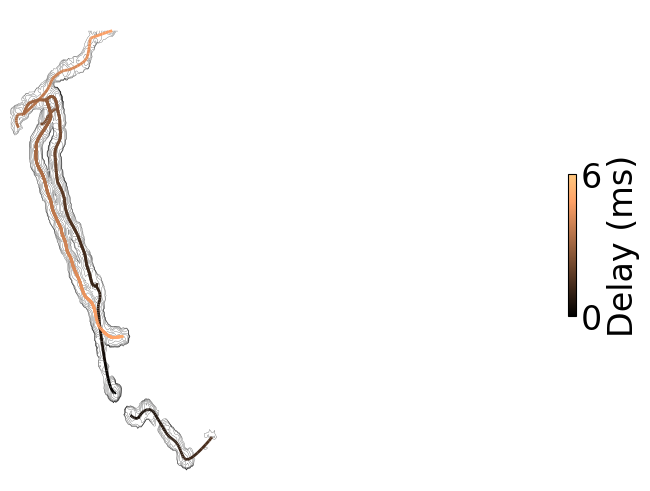

In [79]:
save_path = os.path.join(root_path,stream_id,str(template_id)+'_delay.png')
vis.plot_delay_contour(interp_temp,qc_skeleton,params,skel_params, radius=5, save_path=[], linewidth=2, n_contours = 10)

In [71]:
save_path = os.path.join(root_path,stream_id,str(template_id)+'.png')
save_path

'/net/bs-filesvr02/export/group/hierlemann/intermediate_data/Maxtwo/phornauer/EI_iNeurons/241218/T002523/AxonTracking/well003/137.png'

In [86]:
np.min(interp_temp)

-2.816161632537842

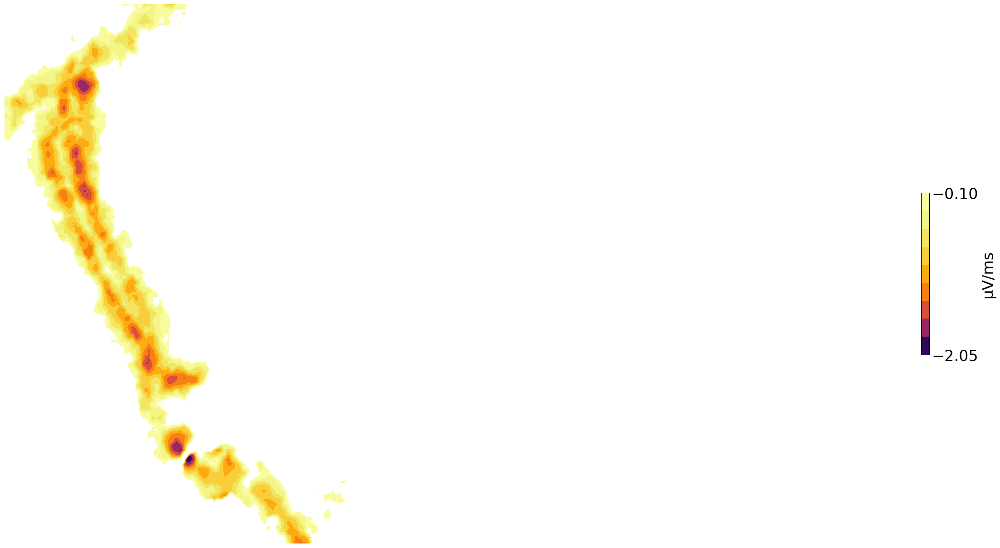

In [91]:
vis.plot_filled_contour(interp_temp,qc_skeleton,params,radius=10,save_path=[])

In [ ]:
import pickle
# Save the skeleton 
# Ideally, the skeleton should be saved in the same folder as the templates
with open('skel.pkl', 'wb') as file: 
    # A new file will be created 
    pickle.dump(qc_skeleton, file) 

In [ ]:
# Load the skeleton
with open('skel.pkl', 'rb') as file: 
    # Call load method to deserialze 
    myvar = pickle.load(file) 